# Urban Greenspace and Asthma Prevalence

### Get Started with Big Data Pipelines

Vegetation has the potential to provide many ecosystem services in urban areas, such as cleaner air and water and flood mitigation. However, the results are mixed on relationships between a simple measurement of vegetation cover (such as average NDVI, a measurement of vegetation health) and human health. We do, however, find relationships between landscape metrics that attempt to quantify the connectivity and structure of greenspace and human health. These types of metrics include mean patch size, edge density, and fragmentation.

In this notebook, you will write code to calculate patch, edge, and fragmentation statistics about urban greenspace in Chicago. These statistics should be reflective of the connectivity and spread of urban greenspace, which are important for ecosystem function and access. You will then use a linear model to identify statistically significant correlations between the distribution of greenspace and health data compiled by the US Center for Disease Control.

#### Read More
Check out this study by [Tsai et al. 2019](https://doi.org/10.1007/s11252-018-0813-3) on the relationship between edge density and life expectancy in Baltimore, MD. The authors also discuss the influence of scale (e.g. the resolution of the imagery) on these relationships, which is important for this case study.

Full citation: Tsai, Wei-Lun, Yu-Fai Leung, Melissa R. McHale, Myron F. Floyd, and Brian J. Reich. 2019. “Relationships Between Urban Green Land Cover and Human Health at Different Spatial Resolutions.” *Urban Ecosystems* 22 (2): 315–24. https://doi.org/10.1007/s11252-018-0813-3.

### Working with larger-than-memory (big) data

For this project, we are going to split up the green space (NDVI) data
by census tract, because this matches the human health data from the
CDC. If we were interested in the average NDVI at this spatial scale, we
could easily use a source of multispectral data like Landsat (30m) or
even MODIS (250m) without a noticeable impact on our results. However,
because we need to know more about the structure of green space within
each tract, we need higher resolution data. For that, we will access the
National Agricultural Imagery Program (NAIP) data, which is taken for
the continental US every few years at 1m resolution. That’s enough to
see individual trees and cars! The main purpose of the NAIP data is, as
the name suggests, agriculture. However, it’s also a great source for
urban areas where lots is happening on a very small scale.

The NAIP data for the City of Chicago takes up about 20GB of space. This
amount of data is likely to crash your kernel if you try to load it all
in at once. It also would be inconvenient to store on your harddrive so
that you can load it in a bit at a time for analysis. Even if you are
using a computer that would be able to handle this amount of data,
imagine if you were analysing the entire United States over multiple
years!

To help with this problem, you will use cloud-based tools to calculate
your statistics instead of downloading rasters to your computer or
container. You can crop the data entirely in the cloud, thereby saving
on your memory and internet connection, using `rioxarray`.

### Check your work with testing!

This notebook does not have pre-built tests. You will need to write your
own test code to make sure everything is working the way that you want.
For many operations, this will be as simple as creating a plot to check
that all your data lines up spatially the way you were expecting, or
printing values as you go. However, if you don’t test as you go, you are
likely to end up with intractable problems with the final code.

## STEP 1: Set up your analysis

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><p>As always, before you get started:</p>
<ol type="1">
<li>Import necessary packages</li>
<li>Create <strong>reproducible file paths</strong> for your project
file structure.</li>
<li>To use cloud-optimized GeoTiffs, we recommend some settings to make
sure your code does not get stopped by a momentary connection lapse –
see the code cell below.</li>
</ol></div></div>

In [ ]:
### Import libraries

# data directories/paths and organization
import os
import pathlib

# see warnings
import warnings

# packages to work with various file types and perform operations
# dataframes, arrays, GeoTIFFs, etc
import xarray as xr #arrays
import rioxarray as rxr #geographic arrays (i.e. TIFF files)
import rioxarray.merge as rxrmerge
import pandas as pd # dataframes
import numpy as np # mathematical operations on the data
import geopandas as gpd # geodataframes

# visualition packages
import geoviews as gv
import holoviews as hv
import hvplot.pandas
import hvplot.xarray
from cartopy import crs as ccrs
import shapely
import time

# data exploration and visualization
import matplotlib
import scipy.stats as stats
import matplotlib.pyplot as plt

# image processing
from scipy.ndimage import convolve
from scipy.ndimage import label

# cloud data
# This package lets us connect to the Microsoft Planetary Computer and perform operations on their servers
import pystac_client

# Import Sodapy and Socrata Packages
### If you haven't installed sodapy to your environment yet, you'll need to do so.
# There are instructions on performing this step later in the notebook
from sodapy import Socrata

# progress bar to monitor long downloads/processes
from tqdm.notebook import tqdm

# OLS regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold

In [2]:
### Create reproducible file paths

# set a data directory path
data_dir = os.path.join(pathlib.Path.home(), 
                        
                        # these folders are applicable to my file structure; you may want to change them to fit yours
                        "Documents", 
                        "Graduate_School",
                        "EDA_Certificate", 
                        "Spring",
                        "data",
                        "01-urban-greenspace",)

# Make the directory
os.makedirs(data_dir, exist_ok=True)

In [3]:
### revent GDAL from quitting due to momentary disruptions
os.environ["GDAL_HTTP_MAX_RETRY"] = "5"
os.environ["GDAL_HTTP_RETRY_DELAY"] = "1"

## STEP 2: Create a site map

We’ll be using the Center for Disease Control (CDC) Places dataset for
human health data to compare with vegetation metrics. CDC Places also provides
some modified census tracts, clipped to the city boundary, to go along
with the health data. We’ll start by downloading the matching geographic
data, and then select the City of Chicago.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Download the Census tract Shapefile that goes along with CDC
Places</li>
<li>Use a <strong>row filter</strong> to select only the census tracts
in Chicago</li>
<li>Use a <strong>conditional statement</strong> to cache your download.
There is no need to cache the full dataset – stick with your pared down
version containing only Chicago.</li>
</ol></div></div>


In [4]:
### Set up the census tract path
tract_dir = os.path.join(data_dir, "chicago_tract")

# Make the directory
os.makedirs(tract_dir, exist_ok=True)

# Make a path to the tract shapefile
tract_path = os.path.join(tract_dir, "chicago_tract.shp")

### Download the census tracts (only once)
if not os.path.exists(tract_path):
    tract_url = ('https://data.cdc.gov/download/x7zy-2xmx/application%2Fzip')
    tract_gdf = gpd.read_file(tract_url)
    chicago_gdf = tract_gdf[tract_gdf.PlaceName == "Chicago"] # subset the tract gdf
    chicago_gdf.to_file(tract_path, index=False) # save the file for later use
else:
    ### Load in census tract data
    chicago_gdf = gpd.read_file(tract_path)
    print("File has already been downloaded! It has been loaded into 'chicago_gdf'.")

File has already been downloaded! It has been loaded into 'chicago_gdf'.


In [5]:
### Site plot -- Census tracts with satellite imagery in the background
(chicago_gdf
 # Set crs
 .to_crs(ccrs.Mercator())
 .hvplot(
    line_color = 'Red', fill_color = 'None',
    crs = ccrs.Mercator(), tiles = 'EsriImagery',
    frame_width=600,
    title='Census Tracts of Chicago',
    xlabel='Longitude',
    ylabel='Latitude'
    )
)

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-respond"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Reflect and Respond</div></div><div class="callout-body-container callout-body"><p>What do you notice about the City of Chicago from the coarse
satellite image? Is green space evenly distributed? What can you learn
about Chicago from websites, scientific papers, or other resources that
might help explain what you see in the site map?</p></div></div>

**CITY OF CHICAGO DATA DESCRIPTION**

From a cursory glance, it looks like there is more greenspace on the northern and southern edges of the city, as well as along the lakeshore. In general, the census tracts in these areas seem to be larger, which I'm assuming means that the houses are more spread out, and there might be more vegetation. In the middle of the city (from both N-S and E-W perspectives), the census tracts are much more compact. In addition, the satellite imagery make it seem like these areas are most intensively developed, with less obvious greenery and more anthropogenic materials.

Comparing the satellite imagery with maps of historical redlining practices implies a correlation for these more compact and developed census tracts in the middle of Chicago. The University of Richmond has [an excellent interactive map](https://dsl.richmond.edu/panorama/redlining/map/IL/Chicago/population#loc=10/41.8716/-87.8041) that shows neighborhoods that were historicaly redlined. These neighborhoods are predominately in the middle of the city, with smaller arms stretching south and north.

However, [the most recent environmental justice assessment](https://www.chicago.gov/city/en/depts/cdph/supp_info/Environment/cumulative-impact-assessment.html) from the City of Chicago indicates that different areas than I've identified have the highest concentration of concerning metrics (asthma being one among multiple tracked). The report indicates that the West and South areas of the city are at highest risk. While this doesn't explicitly describe asthma rates in relation to greenspaces, it's worth keeping this fact in mind throughout the analysis. [Here is a map that shows the Chicago Environmental Justice Index](https://www.chicago.gov/content/dam/city/depts/cdph/environment/CumulativeImpact/Chicago-EJ-Index_CAs-1500x2318.jpg).

Citations:
Nelson, Robert K., LaDale Winling, et al. "Mapping Inequality: Redlining in New Deal America." Edited by Robert K. Nelson. American Panorama: An Atlas of United States History, 2023. https://dsl.richmond.edu/panorama/redlining.

City of Chicago. Chicago Environmental Justice Index Methodology. Chicago: Chicago Department of Public Health, November 21, 2023. https://www.chicago.gov/content/dam/city/depts/cdph/environment/CumulativeImpact/2023-nov/CIA_ChicagoEnvironmentalJusticeIndexMethodology_Updated_11.21.2023.pdf.


## STEP 3 - Access Asthma and Urban Greenspaces Data

### Step 3a - Access human health data

The U.S. Center for Disease Control (CDC) provides a number of health
variables through their [Places
Dataset](https://www.cdc.gov/places/index.html) that might be correlated
with urban greenspace. For this assignment, start with adult asthma. Try
to limit the data as much as possible for download. Selecting the state
and county is a one way to do this.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>You can access Places data with an API, but as with many APIs it is
easier to test out your search before building a URL. Navigate to the <a
href="https://data.cdc.gov/500-Cities-Places/PLACES-Local-Data-for-Better-Health-Census-Tract-D">Places
Census Tract Data Portal</a> and search for the data you want.</li>
<li>The data portal will make an API call for you, but there is a
simpler, easier to read and modify way to form an API call. Check out to
the <a href="https://dev.socrata.com/docs/endpoints">socrata
documentation</a> to see how. You can also find some limited examples
and a list of available parameters for this API on <a
href="https://dev.socrata.com/foundry/data.cdc.gov/cwsq-ngmh">CDC Places
SODA Consumer API Documentation</a>.</li>
<li>Once you have formed your query, you may notice that you have
exactly 1000 rows. The Places SODA API limits you to 1000 records in a
download. Either narrow your search or check out the
<code>&amp;$limit=</code> parameter to increase the number of rows
downloaded. You can find more information on the <a
href="https://dev.socrata.com/docs/paging">Paging page of the SODA API
documentation</a></li>
<li>You should also clean up this data by renaming the
<code>'data_value'</code> to something descriptive, and possibly
selecting a subset of columns.</li>
</ol></div></div>

Chicago search terms:
IL, cook (county), CASTHMA (current asthma)

In [ ]:
# Install sodapy

# uncomment if sodapy needs to be installed
#!pip install sodapy

API URLs shared in class:

https://dev.socrata.com/foundry/data.cdc.gov/cwsq-ngmh

https://[data source]/resource/[dataset id].[file extension]

https://data.cdc.gov/resource/

In [6]:
### Set up a path for the asthma data
asth_dir = os.path.join(data_dir, "asthma_data")
os.makedirs(asth_dir, exist_ok=True)
asth_path = os.path.join(asth_dir, "asthma.csv")


In [ ]:
# This method will work, but there's a cleaner method below

asth_test_path = os.path.join(asth_dir, "asthma_test.csv")
### Download asthma data (only once)

if not os.path.exists(asth_test_path):
    cdc_url = (
        #url
        'https://data.cdc.gov/resource/cwsq-ngmh.csv'
        
        # search parameters
        '?year=2023'
        '&stateabbr=IL'
        '&countyname=Cook'
        '&measureid=CASTHMA'
        '&$limit=1500'
        )
    
    asth_df = (
        # open the file
        pd.read_csv(cdc_url)

        # rename columns
        .rename(columns={
            'data_value': 'asthma',
            'low_confidence_limit': 'asthma_ci_low',
            'high_confidence_limit': 'asthma_ci_high',
            'locationname': 'tract'})

        # Select the columns to keep
        [[
            'year', 'tract',
            'asthma', 'asthma_ci_low', 'asthma_ci_high',
            'data_value_unit',
            'totalpopulation', 'totalpop18plus'
        ]]
    )

    # download to a csv
    asth_df.to_csv(asth_test_path)
else:
    # Load the asthma data in
    asth_df = pd.read_csv(asth_test_path)
    print("The file has already been downloaded! It has been loaded into 'asth_df'.")


### Preview asthma data
asth_df

In [7]:
# Play around with using this method first
if not os.path.exists(asth_path):

    # Use Socrata to download asthma data
    client = Socrata("data.cdc.gov", None)

    # Filter for the parameters we need (Asthma rates in 2023, in Cook County, IL)
    results = client.get("cwsq-ngmh", year='2023', stateabbr="IL", countyname="Cook", measureid="CASTHMA", limit=1500)
    cdc_df = pd.DataFrame.from_records(results)

    # rename and select only important columns
    asth_df = (cdc_df
               .rename(columns={
                   'data_value': 'asthma',
                   'low_confidence_limit': 'asthma_ci_low',
                   'high_confidence_limit': 'asthma_ci_high',
                   'locationname': 'tract'})
                
                # Select the columns to keep
                [[
                    'year', 'tract',
                    'asthma', 'asthma_ci_low', 'asthma_ci_high',
                    'data_value_unit',
                    'totalpopulation', 'totalpop18plus']]
    )
    # download to a csv
    asth_df.to_csv(asth_path)
else:
    asth_df = pd.read_csv(asth_path)
    print("The file has already been downloaded! It has been loaded into 'asth_df'.")

# Check that the download worked
asth_df

The file has already been downloaded! It has been loaded into 'asth_df'.


,Unnamed: 0,year,tract,asthma,asthma_ci_low,asthma_ci_high,data_value_unit,totalpopulation,totalpop18plus
0,0,2023,17031071700,9.1,8.1,10.1,%,1660,1325
1,1,2023,17031120300,8.8,7.8,9.8,%,6920,5212
2,2,2023,17031010501,9.9,8.9,11.0,%,4206,3762
3,3,2023,17031031000,8.9,7.9,9.9,%,3868,3439
4,4,2023,17031062400,9.2,8.2,10.3,%,1673,1389
...,...,...,...,...,...,...,...,...,...
1323,1323,2023,17031840400,7.9,7.1,8.8,%,3369,2662
1324,1324,2023,17031837300,13.7,12.3,15.0,%,2489,1835
1325,1325,2023,17031840000,8.4,7.5,9.3,%,3001,2428
1326,1326,2023,17031840700,8.3,7.3,9.2,%,3900,2885


### Step 3b - Join health data with census tract boundaries

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Join the census tract <code>GeoDataFrame</code> with the asthma
prevalence <code>DataFrame</code> using the <code>.merge()</code>
method.</li>
<li>You will need to change the data type of one of the merge columns to
match, e.g. using <code>.astype('int64')</code></li>
<li>There are a few census tracts in Chicago that do not have data. You
should be able to confirm that they are not listed through the
interactive Places Data Portal. However, if you have large chunks of the
city missing, it may mean that you need to expand the record limit for
your download.</li>
</ol></div></div>

In [8]:
### Change tract identifier datatype for merging
chicago_gdf.tract2010 = chicago_gdf.tract2010.astype('int64')

### Merge census data with geometry
tract_asth_gdf = (
    chicago_gdf
    .merge(asth_df,
           
           # specify which column to merge on as the column names are different
           left_on = 'tract2010',
           right_on = 'tract',

           # inner join
           how = 'inner'
           )
)

# check to make sure the merge worked
tract_asth_gdf

### Plot asthma data as chloropleth
# chloropleth is colorcoded map
(
    # Load basemap w/ satellite imagery
    gv.tile_sources.EsriImagery
    
    *
    
    # map census tracts w/ asthma imagery
    gv.Polygons(
        # reproject to ensure CRSs are aligned
        tract_asth_gdf.to_crs(ccrs.Mercator()),

        # select columns
        vdims = ['asthma', 'tract2010'],

        # double check to ensure CRSs align
        crs = ccrs.Mercator()
    ).opts(color = 'asthma', colorbar = True, 
           tools = ['hover'], clabel = "Asthma Rate")
).opts(
    width = 600, height = 600, 
    xaxis = None, yaxis = None,
    title = "Asthma Density per Census Tract in Chicago")

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (asthma,tract2010)

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-respond"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Reflect and Respond</div></div><div class="callout-body-container callout-body"><p>Write a description and citation for the asthma prevalence data. Do
you notice anything about the spatial distribution of asthma in Chicago?
From your research on the city, what might be some potential causes of
any patterns you see?</p></div></div>

**CDC PLACES DESCRIPTION**

Across most census tracts, the asthma rate seems to be roughly 8-9% of the population. However, there are distinct areas of the city with much higher asthma rates, reaching as high as 15.8%. These areas are concentrated in the wouth and central-west zones of the city. This lines up well with the Chicago Environmental Justice Index report, which indicated that overall, the southern and western parts of the city have the highest index of enivronmental justice issues as a whole. 

'Industrial zones' may play a role in this. These zones are sited near railroad lines, and zoned so residentail building can't take place within them. As indicated by [City of Chicago maps](https://data.cityofchicago.org/Community-Economic-Development/Boundaries-Industrial-Corridors-current-/e6xh-nr8w), most industrial zones in the city are located in the southern part of the city, which lines up with increased asthma rates in that part of the city. However, industrial zone siting doesn't explain higher asthma rates in the western part of the city.

Historic redlining and industrial zones help explain some of the asthma rates across the city, but don't fully explain the pattern shown in the map above. There are likely other sources of emsissions or barriers to healthcare that are also driving these rates.

Citations:
City of Chicago. Chicago Sustainable Industries: Manufacturing for the 21st Century. Chicago: Department of Housing and Economic Development. https://www.chicago.gov/dam/city/depts/zlup/Sustainable_Development/Publications/Chicago_Sustainable_Industries/CSI_3.pdf.

City of Chicago. “Boundaries - Industrial Corridors (current).” Chicago Data Portal. Last modified September 29, 2023. https://data.cityofchicago.org/Community-Economic-Development/Boundaries-Industrial-Corridors-current-/e6xh-nr8w.


### Step 3c - Get data URLs for urban greenspace imagery

NAIP data are freely available through the Microsoft Planetary Computer
SpatioTemporal Access Catalog (STAC).

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><p>Get started with STAC by accessing the planetary computer catalog
with the following code:</p>
<div class="sourceCode" id="cb1"><pre
class="sourceCode python"><code class="sourceCode python"><span id="cb1-1"><a href="#cb1-1" aria-hidden="true" tabindex="-1"></a>e84_catalog <span class="op">=</span> pystac_client.Client.<span class="bu">open</span>(</span>
<span id="cb1-2"><a href="#cb1-2" aria-hidden="true" tabindex="-1"></a>    <span class="st">&quot;https://planetarycomputer.microsoft.com/api/stac/v1&quot;</span></span>
<span id="cb1-3"><a href="#cb1-3" aria-hidden="true" tabindex="-1"></a>)</span></code></pre></div></div></div>

In [9]:
### Connect to the planetary computer catalog

e84_catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1"
)

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><ol type="1">
<li><p>Using a loop, for each Census Tract:</p>
<ol type="1">
<li><p>Use the following sample code to search for data, replacing the
names with applicable values with descriptive names:</p>
<div class="sourceCode" id="cb1"><pre
class="sourceCode python"><code class="sourceCode python"><span id="cb1-1"><a href="#cb1-1" aria-hidden="true" tabindex="-1"></a>search <span class="op">=</span> e84_catalog.search(</span>
<span id="cb1-2"><a href="#cb1-2" aria-hidden="true" tabindex="-1"></a>    collections<span class="op">=</span>[<span class="st">&quot;naip&quot;</span>],</span>
<span id="cb1-3"><a href="#cb1-3" aria-hidden="true" tabindex="-1"></a>    intersects<span class="op">=</span>shapely.to_geojson(tract_geometry),</span>
<span id="cb1-4"><a href="#cb1-4" aria-hidden="true" tabindex="-1"></a>    datetime<span class="op">=</span><span class="ss">f&quot;</span><span class="sc">{</span>year<span class="sc">}</span><span class="ss">&quot;</span></span>
<span id="cb1-5"><a href="#cb1-5" aria-hidden="true" tabindex="-1"></a>)</span></code></pre></div></li>
<li><p>Access the url using
<code>search.assets['image'].href</code></p></li>
</ol></li>
<li><p>Accumulate the urls in a <code>pd.DataFrame</code> or
<code>dict</code> for later</p></li>
<li><p>Occasionally you may find that the STAC service is momentarily
unavailable. You should include code that will retry the request up to 5
times when you get the
<code>pystac_client.exceptions.APIError</code>.</p></li>
</ol></div></div>

> **Warning**
>
> As always – DO NOT try to write this loop all at once! Stick with one
> step at a time, making sure to test your work. You also probably want
> to add a `break` into your loop to stop the loop after a single
> iteration. This will help prevent long waits during debugging.

In [19]:
### Convert geometry to lat/lon for STAC
tract_latlon_gdf = chicago_gdf.to_crs(4326)

### Define a path to save NDVI stats
ndvi_dir = os.path.join(data_dir, "ndvi_data")
os.makedirs(ndvi_dir, exist_ok=True)
naip_image_url_path = os.path.join(ndvi_dir, "chicago-naip-imagery-urls.csv")

# initialize empty list for census tract IDs
downloaded_tracts = []
# Make a list of NAIP sceneu urls to loop through
scene_dfs = []

### Check for existing data - do not access duplicate tracts

# conditional to only download URLs once
if os.path.exists(naip_image_url_path):
    scene_df = pd.read_csv(naip_image_url_path)
    print("Census tract imagery URLs have been downloaded.")

    # Fill list w/ tract values
    downloaded_tracts = scene_df.tract.values
else:
    print("No census tracts downloaded yet.")

    ### Loop through each census tract
    
    # Loop through each tract value in the gdf
    for i, tract_values in tqdm(tract_latlon_gdf.iterrows()):

        # Extract the tract ID for each i
        tract_values = tract_latlon_gdf.iloc[i] # not sure if this is necessary
        tract = tract_values.tract2010

        ### Check if statistics are already downloaded for this tract
        if not (tract in downloaded_tracts):
            
            ### Repeat up to 5 times in case of a momentary disruption 
            i = 0
            retry_limit = 5
            while i < retry_limit:          

                ### Try accessing the STAC
                try:

                    # Search for naip tiles
                    naip_search = e84_catalog.search(
                        # Identify product we're interested in
                        collections = ['naip'],
                        # imagery that intersects w/ our tracts
                        intersects = shapely.to_geojson(tract_values.geometry),
                        # from 2021
                        datetime = '2021'
                    )

                    ### Build dataframe with tracts and tile urls
                    scene_dfs.append(pd.DataFrame(dict(
                        
                        # tract column
                        tract = tract,
                        # date column
                        date = [pd.to_datetime(scene.datetime).date()
                                # return the scene
                                for scene in naip_search.items()],
                        # make rgbir_href
                        rgbir_href = [scene.assets['image'].href for scene in naip_search.items()]
                        ))
                    )

                    # exit retry loop once STAC request is successful
                    break

                ### Try again in case of an APIError
                except pystac_client.exceptions.APIError:
                    print(
                        f'Could not connect with STAC server.'
                        f'Retrying tract {tract}...')
                    
                    # wait 2 seconds between tries
                    time.sleep(2)
                    i += 1
                    continue


    ### Concatenate the url dataframes
    if scene_dfs:

        # concatenate
        scene_df = pd.concat(scene_dfs).reset_index(drop=True)

    else:
        scene_df = None
        print('URL downloads were unsuccessful.')

    ### Preview the url dataframe
    scene_df
    # Save tract imagery urls
    scene_df.to_csv(naip_image_url_path, index=False)

    # Confirm that imagery URLs have been downloaded and saved
    print("Census tract imagery URLs have been downloaded.")
    scene_df
# scene_df


No census tracts downloaded yet.


0it [00:00, ?it/s]

Census tract imagery URLs have been downloaded.


### Step 3d- Compute NDVI Statistics

Next, calculate some metrics to get at different aspects of the
distribution of greenspace in each census tract. These types of
statistics are called **fragmentation statistics**, and can be
implemented with the `scipy` package. Some examples of fragmentation
statistics are:

*Percentage vegetation*: The percentage of pixels that exceed a vegetation threshold (.12 is
common with Landsat) Mean patch size

*Mean patch size*: The average size of **patches**, or contiguous area exceeding the
vegetation threshold. Patches can be identified with the `label`
function from `scipy.ndimage` 

*Edge density*: The proportion of edge pixels among vegetated pixels. Edges can be
identified by **convolving** the image with a **kernel** designed to
detect pixels that are different from their surroundings.

> **What is convolution?**
>
> If you are familiar with differential equations, convolution is an
> approximation of the LaPlace transform.
>
> For the purposes of calculating edge density, convolution means that
> we are taking all the possible 3x3 chunks for our image, and
> multiplying it by the kernel:
>
> $$
> \text{Kernel} =
> \begin{bmatrix}
> 1 & 1 & 1 \\
> 1 & -8 & 1 \\
> 1 & 1 & 1
> \end{bmatrix}
> $$
>
> The result is a matrix the same size as the original, minus the
> outermost edge. If the center pixel is the same as the surroundings,
> its value in the final matrix will be
> $-8 + 1 + 1 + 1 + 1 + 1 + 1 + 1 + 1 = 0$. If it is higher than the
> surroundings, the result will be negative, and if it is lower than the
> surroundings, the result will be positive. As such, the edge pixels of
> our patches will be negative.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Select a single row from the census tract <code>GeoDataFrame</code>
using e.g. <code>.loc[[0]]</code>, then select all the rows from your
URL <code>DataFrame</code> that match the census tract.</li>
<li>For each URL in crop, merge, clip, and compute NDVI for that census
tract</li>
<li>Set a threshold to get a binary mask of vegetation</li>
<li>Using the sample code to compute the fragmentation statistics. Feel
free to add any other statistics you think are relevant, but make sure
to include a fraction vegetation, mean patch size, and edge density. If
you are not sure what any line of code is doing, make a plot or print
something to find out! You can also ask ChatGPT or the class.</li>
</ol></div></div>

In [35]:
# pull out first tract value and convert to a string
tract = tract_asth_gdf.loc[0].tract2010.astype('str')

# convert tract to string
tract = str(tract)
tract


'17031010100'

In [28]:
# check out an individual url
href_value = scene_df.loc[
    scene_df.tract.astype(str) == tract,

    # column to extract
    'rgbir_href'
].iloc[0]

href_value

'https://naipeuwest.blob.core.windows.net/naip/v002/il/2021/il_060cm_2021/42087/m_4208759_se_16_060_20210908.tif'

In [ ]:
# process 1 scene

# open raster
tile_da = rxr.open_rasterio(

    # give it url
    href_value,

    # mask out NoData pixels
    masked=True,

# remove dimensions of length = 1
).squeeze()

# check it out
tile_da

In [30]:
# check out dimensions
tile_da.dims

('band', 'y', 'x')

In [31]:
print(scene_df.columns)

Index(['tract', 'date', 'rgbir_href'], dtype='object')


In [32]:
tract in tract_asth_gdf['tract2010'].astype(str).values

True

In [ ]:
# get boundary of the tract we're working with
boundary = (
    tract_asth_gdf

    # deal with integer issues; ensure tract2010 values are strings
    .assign(tract2010 = lambda df: df['tract2010'].astype(str))

    # use tractID as the index
    .set_index('tract2010')

    # grab the tract in question
    .loc[[str(tract)]]

    # ensure CRSs match
    .to_crs(tile_da.rio.crs)

    # get the geometry
    .geometry
)

boundary

tract2010
17031010100    POLYGON ((444936.583 4652546.967, 444935.043 4...
Name: geometry, dtype: geometry

In [34]:
# crop to bounding box
crop_da = tile_da.rio.clip_box(

    # get coordinates of bounding box
    *boundary.envelope.total_bounds,

    # can let it expand a bit
    auto_expand = True
)

crop_da

<xarray.DataArray (band: 4, y: 724, x: 1862)> Size: 22MB
[5392352 values with dtype=float32]
Coordinates:
  * band         (band) int64 32B 1 2 3 4
  * x            (x) float64 15kB 4.439e+05 4.439e+05 ... 4.451e+05 4.451e+05
  * y            (y) float64 6kB 4.653e+06 4.653e+06 ... 4.652e+06 4.652e+06
    spatial_ref  int64 8B 0
Attributes:
    TIFFTAG_DOCUMENTNAME:      Evanston SE 4208759
    TIFFTAG_IMAGEDESCRIPTION:  Image courtesy of USDA Farm Service Agency's N...
    TIFFTAG_DATETIME:          2021:10:21 20:26:02
    TIFFTAG_ARTIST:            Surdex Corporation, 636-368-4400, www.surdex.com
    TIFFTAG_HOSTCOMPUTER:      AMDNODE7
    AREA_OR_POINT:             Area
    scale_factor:              1.0
    add_offset:                0.0

In [36]:
# now clip to exact boundary; this two step process is a lot faster
clip_da = crop_da.rio.clip(
    boundary,

    # all pixels touched by the boundary
    all_touched=True
)

clip_da

<xarray.DataArray (band: 4, y: 724, x: 1862)> Size: 22MB
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]],
      shape=(4, 724, 1862), dtype=float32)
Coordinates:
  * band         (band) int64 32B 1 2 3 4
  * x            (x) float64 15kB 4.439e+05 4.439e+05 ... 4.451e+05 4.451e+05
  * y            (y) float64 6kB 4.653e+06 4.653e+06 ... 4.652e+06 4.652e+06
    spatial_ref  int64 8B 0
Attributes:
    TIFFTAG_DOCUMENTNAME:      Evanston SE 4208759
    TIFFTAG_IMAGEDESCRIPTION:  Image courtesy of USDA Farm Service Agency's N...
    TIFFTAG_DATETIME:          2021:10:21 20:26:02
    TIFFTAG_ARTIST:            Surdex Corporation, 636-368-4400, www.surdex.com
    TIFFTAG_HOSTCOMPUTER:      AMDNODE7
    AREA_OR_POINT:             Area
    scale_factor:              1.0
    add_offset:                0.0

In [37]:
clip_da.shape

(4, 724, 1862)

In [38]:
# do NDVI math
# NDVI = (NIR-R)/(NIR+R)

ndvi_da = (
    (clip_da.sel(band = 4) - clip_da.sel(band = 1))
    / (clip_da.sel(band = 4) + clip_da.sel(band = 1))
)

ndvi_da

<xarray.DataArray (y: 724, x: 1862)> Size: 5MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]],
      shape=(724, 1862), dtype=float32)
Coordinates:
  * x            (x) float64 15kB 4.439e+05 4.439e+05 ... 4.451e+05 4.451e+05
  * y            (y) float64 6kB 4.653e+06 4.653e+06 ... 4.652e+06 4.652e+06
    spatial_ref  int64 8B 0

In [ ]:
### Skip this step if data are already downloaded 
if not scene_df is None:

    ### Get an example 
    # pull out an identifier for an example tract
    tract = tract_asth_gdf.loc[0].tract2010

    # subset scene_df to only include that tract
    ex_scene_gdf = scene_df[scene_df.tract == tract]

    ### Loop through all images for tract
    # make a list to iterate through
    tile_das = []

    # loop through all the images for this tract
    for _, href_s in ex_scene_gdf.iterrows():

        ### Open vsi connection to data
        tile_da = rxr.open_rasterio(

            # raster location
            href_s.rgbir_href,

            # deal w/ no data, remove extra dimensions
            masked=True).squeeze()
        
        ### Make the bounding box of the census tract
        boundary = (
            tract_asth_gdf

            # deal with integer issues
            .assign(tract2010 = lambda df: df['tract2010'].astype(str))

            # use tractID as the index
            .set_index('tract2010')

            # grab the tract in question
            .loc[[str(tract)]]

            # ensure CRSs match
            .to_crs(tile_da.rio.crs)

            # get the geometry
            .geometry
        )

        ### Crop data to the bounding box of the census tract
        crop_da = tile_da.rio.clip_box(

                # get coordinates of bounding box
                *boundary.envelope.total_bounds,

                # can let it expand a bit
                auto_expand = True
            )
            
        ### Clip data to the boundary of the census tract (the two step process is faster)
        clip_da = crop_da.rio.clip(
            boundary,

            # all pixels touched by the boundary
            all_touched=True
        )

        ### Compute NDVI
        # NDVI = (NIR-R)/(NIR+R)
        ndvi_da = (
            (clip_da.sel(band = 4) - clip_da.sel(band = 1))
            / (clip_da.sel(band = 4) + clip_da.sel(band = 1))
        )

        ### Accumulate result
        tile_das.append(ndvi_da)

# Check results
print(f"Number of tiles in tiles_da: {len(tile_das)}")

### Merge data
scene_da = rxrmerge.merge_arrays(tile_das)
#scene_da

# ### Mask vegetation
veg_mask = (scene_da > 0.3)

# ### Calculate mean patch size
labeled_patches, num_patches = label(veg_mask)
patch_sizes = np.bincount(labeled_patches.ravel())[1:]
mean_patch_size = patch_sizes.mean()

Number of tiles in tiles_da: 1


array([1716,    1,  288, ...,    1,    1,    1], shape=(3426,))

In [46]:

### Make kernel to calculate edge density
kernel = np.array([
    [1, 1, 1], 
    [1, -8, 1], 
    [1, 1, 1]])

### Calculate edge density
edges = convolve(veg_mask, kernel, mode='constant')
edge_density = np.sum(edges != 0) / veg_mask.size

edge_density

np.float64(0.11861243479654147)

### Repeat for all tracts

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><ol type="1">
<li><p>Using a loop, for each Census Tract:</p>
<ol type="1">
<li><p>Using a loop, for each data URL:</p>
<ol type="1">
<li>Use <code>rioxarray</code> to open up a connection to the STAC
asset, just like you would a file on your computer</li>
<li>Crop and then clip your data to the census tract boundary &gt; HINT:
check out the <code>.clip_box</code> parameter <code>auto_expand</code>
and the <code>clip</code> parameter <code>all_touched</code> to make
sure you don’t end up with an empty array</li>
<li>Compute NDVI for the tract</li>
</ol></li>
<li><p>Merge the NDVI rasters</p></li>
<li><p>Compute:</p>
<ol type="1">
<li>total number of pixels within the tract</li>
<li>fraction of pixels with an NDVI greater than .12 within the tract
(and any other statistics you would like to look at)</li>
</ol></li>
<li><p>Accumulate the statistics in a file for later</p></li>
</ol></li>
<li><p>Using a conditional statement, ensure that you do not run this
computation if you have already saved values. You do not want to run
this step many times, or have to restart from scratch! There are many
approaches to this, but we actually recommend implementing your caching
in the previous cell when you generate your dataframe of URLs, since
that step can take a few minutes as well. However, the important thing
to cache is the computation.</p></li>
</ol></div></div>

In [47]:
# Make CSV for NDVI statistics
ndvi_path_veg = os.path.join(ndvi_dir, 'chicago_ndvi_stats_veg.csv')

In [ ]:
### make sure to explain what each step is doing

# big conditional to ensure we only download data once and the whole notebook can be run
if not os.path.exists(ndvi_path_veg):

    # Message to clearly indicate status
    print("NDVI statistics have not been downloaded yet. Downloading now...")

    ### Skip this step if data are already downloaded
    if not scene_df is None: 

        ### Loop through the census tracts with URLs
        for tract, tract_date_gdf in tqdm(scene_df.groupby('tract')):

            ### Open all images for tract
            # create a list to store NDVI array; 1 array per NAIP image
            tile_das = []

            # Try/Except block to prevent tract ID; I used Gemini to help me identify the issue here

            # iterate over rows in tract-specific DF
            for _, href_s in tract_date_gdf.iterrows():

                ### Open vsi connection to data
                tile_da = rxr.open_rasterio(
                    
                    # mask and squeeze
                    href_s.rgbir_href, masked=True).squeeze()
                
                ### Clip data (1. get boundary 2. crop to bounding box 3. clip to exact geoms)
                # get tract boundary
                boundary = (
                    chicago_gdf
                    # deal with integer issues
                    .assign(tract2010 = lambda df: df['tract2010'].astype(str))
                    # use tractID as the index
                    .set_index('tract2010')
                    # get the tract in question
                    .loc[[str(tract)]]
                    # make sure CRSs match
                    .to_crs(tile_da.rio.crs)
                    # and take the geometry of that boundary
                    .geometry
                )

                # crop to a bounding box
                crop_da = tile_da.rio.clip_box(
                    # get coordinates of bounding box
                    *boundary.envelope.total_bounds,
                    # ensure any pixels right on the boundary are included
                    auto_expand = True
                )

                # clip to actual tract geometry (again, this two-step process just makes it faster)
                clip_da = crop_da.rio.clip(
                    boundary, 
                    # any pixels on boundary are included
                    all_touched=True)
                    
                # Compute NDVI for each image within the boundary
                # NDVI = (NIR-R)/(NIR+R)
                ndvi_da = (
                    (clip_da.sel(band = 4) - clip_da.sel(band = 1))
                    / (clip_da.sel(band = 4) + clip_da.sel(band = 1))
                )

                ### Accumulate result
                tile_das.append(ndvi_da)

            ### Merge data
            scene_da = rxrmerge.merge_arrays(tile_das)

            ### Mask vegetation
            veg_mask = (scene_da > 0.3) # we've picked NDVI values that are >0.3 for pixels to be counted as "vegetated"

            ### Calculate statistics and save data to file
            # count all the valid pixels and all the vegetated pixels in the tract 
            total_pixels = scene_da.notnull().sum()
            veg_pixels = veg_mask.sum()

            ### Identify vegetation patches by labeling each patch of vegetation
            labeled_patches, num_patches = label(veg_mask)

            # Count pixels in each patch, then calculate the mean patch size for each tract
            patch_sizes = np.bincount(labeled_patches.ravel())[1:]
            mean_patch_size = patch_sizes.mean()

            ### Calculate edge density
            # define kernel
            kernel = np.array([
                [1, 1, 1],
                [1, -8, 1],
                [1, 1, 1]])
            
            # detect boundaries between veg and non-veg
            edges = convolve(veg_mask, kernel, mode = 'constant')

            # calculate proportion of edge pixels by tract area
            edge_density = np.sum(edges != 0) / veg_mask.size
            
            ### Now, save all of these statistics we've calculated:
            ### Add a row to the statistics file that captures all of the tracts
            # create new DF for the tract and append it to the CSV
            
            pd.DataFrame(dict(           
                # Store tract ID
                tract = [tract],
                # store total pixel count as an integer
                total_pixels = [int(total_pixels)],
                # store fractions of vegetated pixels (have to use float b/c not whole number)
                frac_veg = [float(veg_pixels / total_pixels)],
                # store mean patch size
                mean_patch_size = [mean_patch_size],
                # store edge density
                edge_density = [edge_density]

            # write stats DF to the CSV we've established
            )).to_csv(
                ndvi_path_veg,
                # Append the data
                mode = 'a',
                # get rid of row numbers
                index = False,
                # Write column names but only if they haven't been written yet
                header = (not os.path.exists(ndvi_path_veg))
            )

    ### Re-load results from file
    ndvi_stats_df = pd.read_csv(ndvi_path_veg)
    print("The NDVI Statistics have been downloaded! They have been loaded into 'ndvi_stats_df'")

else:
    ndvi_stats_df = pd.read_csv(ndvi_path_veg)
    print("The NDVI Statistics have already been downloaded! They have been loaded into 'ndvi_stats_df'")

NDVI statistics have not been downloaded yet. Downloading now...


  0%|          | 0/809 [00:00<?, ?it/s]

C:\Users\raini\AppData\Local\Temp\ipykernel_29756\1108651772.py:86: RuntimeWarning: Mean of empty slice.
  mean_patch_size = patch_sizes.mean()
c:\Users\raini\miniconda3\envs\earth-analytics-python\Lib\site-packages\numpy\_core\_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


## STEP 4 - Explore your data with plots

### Chloropleth plots

Before running any statistical models on your data, you should check
that your download worked. You should see differences in both asthma rate and mean NDVI across the City.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><p>Create a plot that contains:</p>
<ul>
<li>2 side-by-side chloropleth plots</li>
<li>Asthma prevelence on one plot and mean NDVI on the other</li>
<li>Make sure to include a title and labeled color bars</li>
</ul></div></div>

In [57]:
### Merge census data with geometry
chi_ndvi_asthm_gdf = (

    # Grab census tract gdf
    tract_asth_gdf

    # merge w/ NDVI df
    .merge(
        ndvi_stats_df,

        # match on the tract ID
        # left: tract2010
        # right: tract
        left_on = 'tract2010',
        right_on = 'tract',
        how = 'inner'
    )
)

# check it out
chi_ndvi_asthm_gdf

,place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,geometry,Unnamed: 0,year,tract_x,...,asthma_ci_low,asthma_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density
0,1714000,17031010100,17,Chicago,1714000-17031010100,4854,"POLYGON ((-9758835.381 5164429.383, -9758837.3...",203,2023,17031010100,...,10.1,12.5,%,4905,4083,17031010100,1059033,0.178657,55.225919,0.118612
1,1714000,17031010201,17,Chicago,1714000-17031010201,6450,"POLYGON ((-9760143.496 5163888.741, -9760143.4...",34,2023,17031010201,...,10.0,12.4,%,6939,5333,17031010201,1531554,0.213859,57.543394,0.161668
2,1714000,17031010202,17,Chicago,1714000-17031010202,2818,"POLYGON ((-9759754.212 5163883.196, -9759726.6...",65,2023,17031010202,...,9.1,11.3,%,2742,2296,17031010202,978546,0.186055,63.260250,0.123673
3,1714000,17031010300,17,Chicago,1714000-17031010300,6236,"POLYGON ((-9758695.229 5163870.91, -9758695.78...",162,2023,17031010300,...,9.1,11.3,%,6305,5606,17031010300,1308392,0.191675,57.113642,0.126384
4,1714000,17031010400,17,Chicago,1714000-17031010400,5042,"POLYGON ((-9757724.634 5160715.939, -9757742.2...",151,2023,17031010400,...,9.5,11.7,%,5079,4742,17031010400,1516964,0.198563,52.983817,0.079474
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783,1714000,17031770700,17,Chicago,1714000-17031770700,0,"POLYGON ((-9780753.304 5157066.079, -9780752.0...",805,2023,17031770700,...,8.6,10.8,%,2537,2093,17031770700,5547730,0.022761,7.584359,0.020706
784,1714000,17031770800,17,Chicago,1714000-17031770800,0,"POLYGON ((-9783235.84 5154620.343, -9783211.23...",919,2023,17031770800,...,8.4,10.6,%,5661,4457,17031770800,174812,0.138652,6.197392,0.172915
785,1714000,17031805600,17,Chicago,1714000-17031805600,0,"POLYGON ((-9776210.02 5161605.738, -9776213.47...",860,2023,17031805600,...,8.1,10.1,%,4710,3420,17031805600,463,0.000000,NaN,0.000000
786,1714000,17031807900,17,Chicago,1714000-17031807900,0,"POLYGON ((-9768609.902 5160576.634, -9768654.5...",781,2023,17031807900,...,7.5,9.4,%,4201,3396,17031807900,26883,0.079121,23.898876,0.101617


In [58]:
### Plot chloropleths with vegetation statistics

# make a plot_chloropleth function
def plot_chloropleth(gdf, **opts):

    # docstring to describe the function
    """Generate a chloropleth with the given color column"""

    # use geoviews to make a polygon object
    return gv.Polygons(

        # use Mercator
        gdf.to_crs(ccrs.Mercator()),

        # set plot crs to Mercator
        crs = ccrs.Mercator()
    
    # drop x and y axis (unnecessary) and add a legend
    ).opts(xaxis = None, yaxis = None, colorbar = True, **opts)

In [ ]:
# Apply function to chicago data; plot edge density
(
    plot_chloropleth(

        # plot asthma by census tract
        chi_ndvi_asthm_gdf, color = 'asthma', cmap = 'viridis', clabel = 'Asthma Rate')
        .opts(width = 400, title = 'Asthma Rate per Census Tract')
    
    # add a second plot w/ vegetation edge density
    + 
    plot_chloropleth(
        # plot vegetation edge density by census tract
        chi_ndvi_asthm_gdf, color = 'edge_density', cmap = 'Greens', clabel = 'Edge Density')
        .opts(width = 400, title = 'Edge Density per Census Tract')
)

:Layout
   .Polygons.I  :Polygons   [Longitude,Latitude]   (place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,Unnamed: 0,year,tract_x,asthma,asthma_ci_low,asthma_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density)
   .Polygons.II :Polygons   [Longitude,Latitude]   (place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,Unnamed: 0,year,tract_x,asthma,asthma_ci_low,asthma_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density)

In [86]:
# Mean patch chloropleth
(
    plot_chloropleth(

        # plot asthma by census tract
        chi_ndvi_asthm_gdf, color = 'asthma', cmap = 'viridis', clabel = 'Asthma Rate')
        .opts(width = 400, title = 'Asthma Rate per Census Tract')
    
    # add a second plot w/ vegetation edge density
    + 
    plot_chloropleth(
        # plot vegetation edge density by census tract
        chi_ndvi_asthm_gdf, color = 'mean_patch_size', cmap = 'Greens', clabel = 'Mean Patch Size')
        .opts(width = 400, title = 'Mean Patch Size per Census Tract')
)

:Layout
   .Polygons.I  :Polygons   [Longitude,Latitude]   (place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,Unnamed: 0,year,tract_x,asthma,asthma_ci_low,asthma_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density)
   .Polygons.II :Polygons   [Longitude,Latitude]   (place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,Unnamed: 0,year,tract_x,asthma,asthma_ci_low,asthma_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density)

In [87]:
# Fraction of Vegetation
(
    plot_chloropleth(

        # plot asthma by census tract
        chi_ndvi_asthm_gdf, color = 'asthma', cmap = 'viridis', clabel = 'Asthma Rate')
        .opts(width = 400, title = 'Asthma Rate per Census Tract')
    
    # add a second plot w/ vegetation edge density
    + 
    plot_chloropleth(
        # plot vegetation edge density by census tract
        chi_ndvi_asthm_gdf, color = 'frac_veg', cmap = 'Greens', clabel = 'Vegetated Fraction')
        .opts(width = 400, title = 'Fraction of Census Tract that is Vegetated')
)

:Layout
   .Polygons.I  :Polygons   [Longitude,Latitude]   (place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,Unnamed: 0,year,tract_x,asthma,asthma_ci_low,asthma_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density)
   .Polygons.II :Polygons   [Longitude,Latitude]   (place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,Unnamed: 0,year,tract_x,asthma,asthma_ci_low,asthma_ci_high,data_value_unit,totalpopulation,totalpop18plus,tract_y,total_pixels,frac_veg,mean_patch_size,edge_density)

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-response"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div></div><div class="callout-body-container callout-body"><p>Do you see any similarities in your plots? Do you think there is a
relationship between adult asthma and any of your vegetation statistics
in Chicago? Relate your visualization to the research you have done (the
context of your analysis) if applicable.</p></div></div>

**PLOT DESCRIPTION**

Chloropleth plots of edge density, mean patch size, and vegetated fraction show related patterns of vegetation across the city. Vegetation is most concentrated in the northeast, northwest and southwest corners of the city, with a band of vegetation running down the northern shore of Lake Michigan. Vegetation patterns appear to be somewhat negatively correlated with asthma rates, though that relationship doesn't seem to be strong. 

In general there are higher rates of asthma in the southern part of the city, and there is less vegetation there, in general. This area is more industrial than others, so it would make sense that the combination of more industry and fewer trees would have an impact on asthma rates.

Interestingly, there is a small, roughly triangle-shaped group of tracts in the southwestern corner that have much more vegetation than neighboring tracts, and asthma rates are lower in the group as well, relative to the neighbors. 

However, the elevated asthma rates in the central-west region of the city aren't well explained by vegetation statistics.

## STEP 5: Explore a linear ordinary least-squares regression

### Model description

One way to find if there is a statistically significant relationship
between asthma prevalence and greenspace metrics is to run a linear
ordinary least squares (OLS) regression and measure how well it is able
to predict asthma given your chosen fragmentation statistics.

Before fitting an OLS regression, you should check that your data are
appropriate for the model.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Reflect and Respond</div></div><div class="callout-body-container callout-body"><p>Write a model description for the linear ordinary least-squares
regression that touches on:</p>
<ol type="1">
<li>Assumptions made about the data</li>
<li>What is the objective of this model? What metrics could you use to
evaluate the fit?</li>
<li>Advantages and potential problems with choosing this model.</li>
</ol></div></div>

**OLS Regression and Greenspace Data**

1. There are a few assumptions I'm making about the data as I consider using an OLS regression. First, 

2. 

3. 

### Step 5a - Data preparation

When fitting statistical models, you should make sure that your data
meet the model assumptions through a process of selection and/or
transformation.

You can select data by:

-   Eliminating observations (rows) or variables (columns) that are
    missing data
-   Selecting a model that matches the way in which variables are
    related to each other (for example, linear models are not good at
    modeling circles)
-   Selecting variables that explain the largest amount of variability
    in the dependent variable.

You can transform data by:

-   Transforming a variable so that it follows a normal distribution.
    The `log` transform is the most common to eliminate excessive skew
    (e.g. make the data symmetrical), but you should select a transform
    most suited to your data.
-   Normalizing or standardizing variables to, for example, eliminate
    negative numbers or effects caused by variables being in a different
    range.
-   Performing a principle component analysis (PCA) to eliminate
    multicollinearity among the predictor variables

> **Tip**
>
> Keep in mind that data transforms like a log transform or a PCA must
> be reversed after modeling for the results to be meaningful.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Use the <code>hvplot.scatter_matrix()</code> function to create an
exploratory plot of your data.</li>
<li>Make any necessary adjustments to your data to make sure that they
meet the assumptions of a linear OLS regression.</li>
<li>Check if there are <code>NaN</code> values, and if so drop those
rows and/or columns. You can use the <code>.dropna()</code> method to
drop rows with <code>NaN</code> values.</li>
<li>Explain any data transformations or selections you made and why</li>
</ol></div></div>

In [61]:
# investigate NaN values per column
chi_ndvi_asthm_gdf.isna().any()

place2010          False
tract2010          False
ST                 False
PlaceName          False
plctract10         False
PlcTrPop10         False
geometry           False
Unnamed: 0         False
year               False
tract_x            False
asthma             False
asthma_ci_low      False
asthma_ci_high     False
data_value_unit    False
totalpopulation    False
totalpop18plus     False
tract_y            False
total_pixels       False
frac_veg           False
mean_patch_size     True
edge_density       False
dtype: bool

In [62]:
# NaN values per row
chi_ndvi_asthm_gdf.isna().any(axis = 1)

0      False
1      False
2      False
3      False
4      False
       ...  
783    False
784    False
785     True
786    False
787    False
Length: 788, dtype: bool

In [63]:
# Check the prevalence of NaNs
chi_ndvi_asthm_gdf.isna().sum()

# this demonstrates we'll want to just drop those two rows

place2010          0
tract2010          0
ST                 0
PlaceName          0
plctract10         0
PlcTrPop10         0
geometry           0
Unnamed: 0         0
year               0
tract_x            0
asthma             0
asthma_ci_low      0
asthma_ci_high     0
data_value_unit    0
totalpopulation    0
totalpop18plus     0
tract_y            0
total_pixels       0
frac_veg           0
mean_patch_size    1
edge_density       0
dtype: int64

In [64]:
### Select variables: Make dataframe with the variables we want for the model

variables = ['frac_veg', 'asthma', 'mean_patch_size', 'edge_density']


In [65]:
### Visualize distribution of data

# make a scatter plot
hvplot.scatter_matrix(
    chi_ndvi_asthm_gdf[variables]
)

:GridMatrix   [X,Y]
   :Histogram   [mean_patch_size]   (Count)

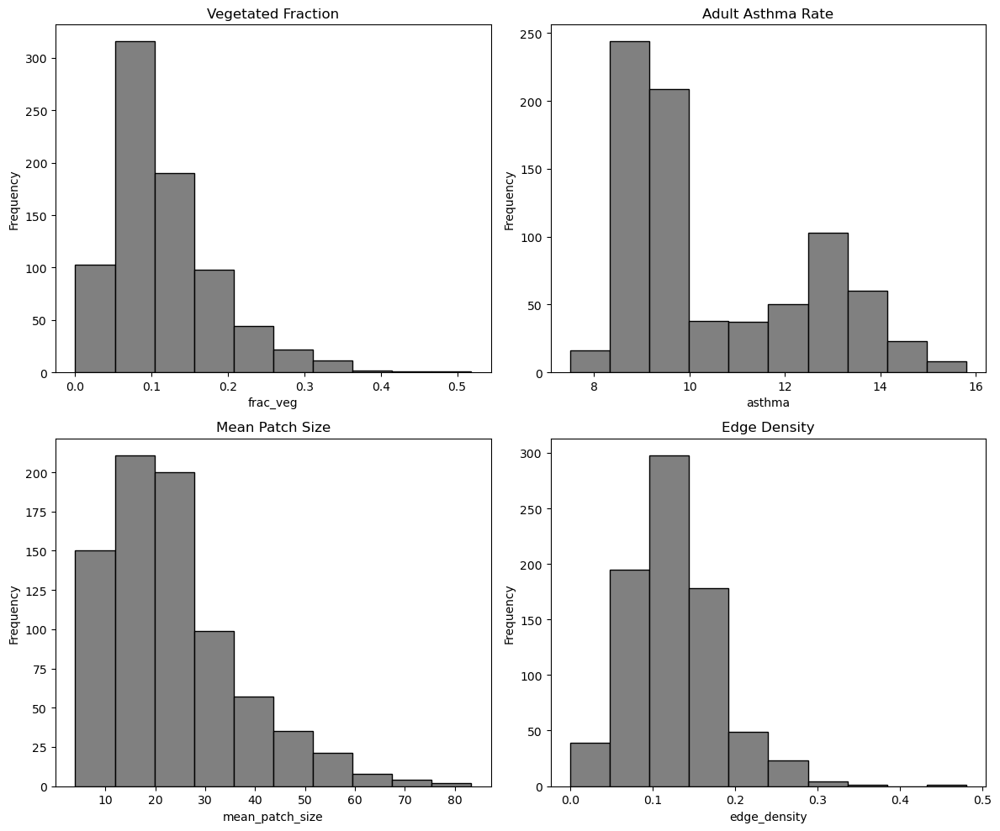

In [67]:
# make histograms of the data

# make facet
fig, axes = plt.subplots(2, 2, figsize = (12,10))

# we'll use the same variables to plot; set more friendly titles
variables = ['frac_veg', 'asthma', 'mean_patch_size', 'edge_density']
titles = ['Vegetated Fraction', 'Adult Asthma Rate', 'Mean Patch Size', 'Edge Density']

# Loop through variables and axes to plot histograms
for i, (var, title) in enumerate(zip(variables, titles)):
    ax = axes[i//2, i%2]
    ax.hist(chi_ndvi_asthm_gdf[var], bins = 10, 
            color = 'gray', edgecolor = 'black')
    ax.set_title(title)
    ax.set_xlabel(var)
    ax.set_ylabel('Frequency')

# Ensure figures don't overlap
plt.tight_layout()
plt.show()

In [83]:
# drop missing observations
model_df = (
    chi_ndvi_asthm_gdf

    # copy that
    .copy()

    # subset the data
    [['frac_veg', 'asthma', 'mean_patch_size', 'edge_density', 'geometry']]

    # drop rows w/o observations
    .dropna()
)

In [69]:
### Perform variable transformation
# the histograms above show that we should probably log transform the asthma and patch size variables

# asthma log
model_df['log_asthma'] = np.log(model_df.asthma)

# mean patch size log
model_df['log_patch'] = np.log(model_df.mean_patch_size)

# double check that those were calculated
model_df

,frac_veg,asthma,mean_patch_size,edge_density,log_asthma,log_patch
0,0.178657,11.3,55.225919,0.118612,2.424803,4.011432
1,0.213859,11.2,57.543394,0.161668,2.415914,4.052539
2,0.186055,10.2,63.260250,0.123673,2.322388,4.147257
3,0.191675,10.2,57.113642,0.126384,2.322388,4.045043
4,0.198563,10.6,52.983817,0.079474,2.360854,3.969987
...,...,...,...,...,...,...
782,0.020053,9.5,13.674242,0.029123,2.251292,2.615514
783,0.022761,9.7,7.584359,0.020706,2.272126,2.026088
784,0.138652,9.5,6.197392,0.172915,2.251292,1.824129
786,0.079121,8.5,23.898876,0.101617,2.140066,3.173831


In [79]:
### Visualize transformed variables

var_log = ['frac_veg', 'edge_density', 'log_asthma', 'log_patch']
hvplot.scatter_matrix(
    model_df[var_log]
)

:GridMatrix   [X,Y]
   :Histogram   [log_patch]   (Count)

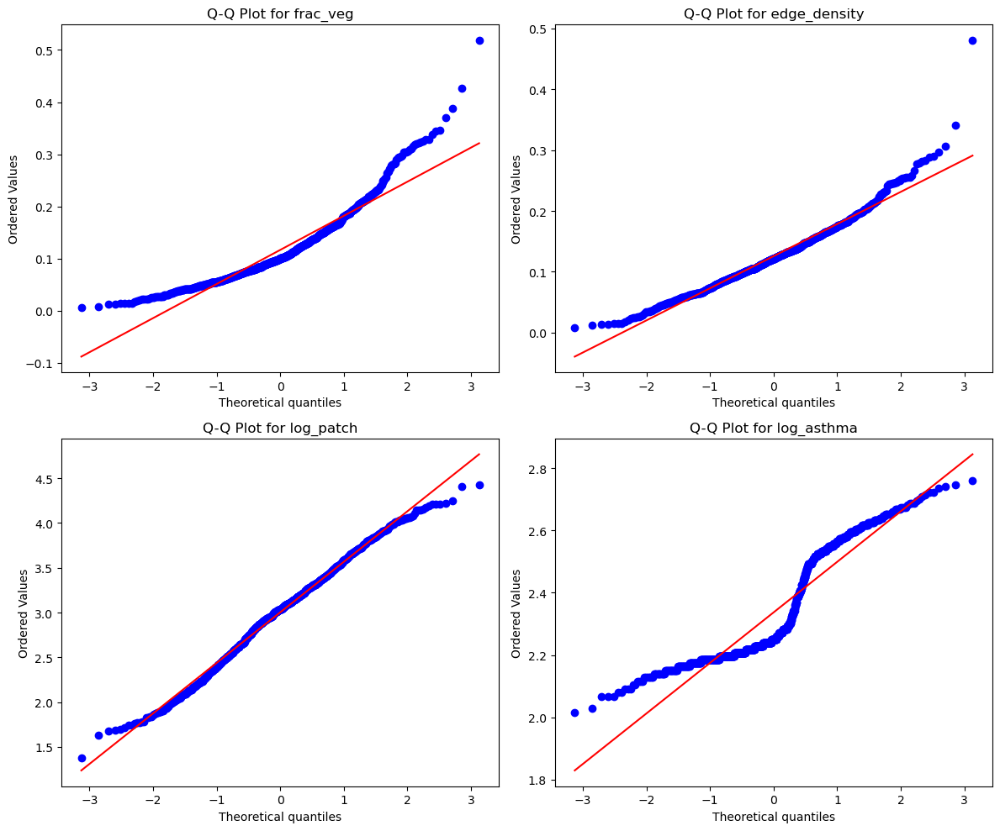

In [81]:
# q-q plots

# set variables
var_qq = ['frac_veg', 'edge_density','log_patch', 'log_asthma']

# make q-q plots
plt.figure(figsize = (12, 10))
for i, var in enumerate(var_qq, 1):

    # make 2x2 facet
    plt.subplot(2, 2, i)

    # normal distribution
    stats.probplot(model_df[var], dist = 'norm', plot = plt)

    # title
    plt.title(f'Q-Q Plot for {var}')

# plot everything
plt.tight_layout()
plt.show()

Reflect and respond: 
**EXPLAIN YOUR SELECTION AND TRANSFORMATION PROCESS HERE**

### Step 5b - Fit and Predict

If you have worked with statistical models before, you may notice that
the `scikitlearn` library has a slightly different approach than many
software packages. For example, `scikitlearn` emphasizes generic model
performance measures like cross-validation and importance over
coefficient p-values and correlation. The scikitlearn approach is meant
to generalize more smoothly to machine learning (ML) models where the
statistical significance is harder to derive mathematically.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Use the scikitlearn documentation or ChatGPT as a starting point,
split your data into training and testing datasets.</li>
<li>Fit a linear regression to your training data.</li>
<li>Use your fitted model to predict the testing values.</li>
<li>Plot the predicted values against the measured values. You can use
the following plotting code as a starting point.</li>
</ol></div></div>

In [75]:
### Select predictor and outcome variables
x = model_df[['edge_density', 'log_patch']]
y = model_df[['log_asthma']]

### Split into training and testing datasets
x_train, x_test, y_train, y_test = train_test_split(
    
    # split up the data, reserving 33% of the data for testing and using 67% for training
    # basically, we'll keep 33% of the data back to test the accuracy of the linear regression
    x, y, test_size=0.33, 
    
    # set the state of the random split so that the same split occurs every time the code is run.
    # this is to ensure reproducibility
    random_state=19
)

### Fit a linear regression
reg = LinearRegression()

# fit to our data
reg.fit(x_train, y_train)

### Predict asthma values for the test dataset
# we have to use np.exp to undo the log transformation we did earlier
y_test['pred_asthma'] = np.exp(reg.predict(x_test))

# Real asthma rate to compare
y_test['asthma'] = np.exp(y_test.log_asthma)

# Check out the comparision
y_test

,log_asthma,pred_asthma,asthma
295,2.186051,9.732369,8.9
549,2.517696,11.587084,12.4
595,2.602690,11.401890,13.5
378,2.151762,10.169009,8.6
16,2.302585,11.200788,10.0
...,...,...,...
548,2.397895,10.809261,11.0
260,2.174752,9.767793,8.8
504,2.557227,10.539560,12.9
529,2.163323,10.278920,8.7


In [77]:
### Plot measured vs. predicted asthma prevalence with a 1-to-1 line
y_max = y_test.asthma.max()

(
    y_test
    .hvplot.scatter(x='asthma', y='pred_asthma',
                    xlabel = 'Measured Adult Asthma Prevalance',
                    ylabel = 'Predicted Adult Asthma Prevalance',
                    title = 'Linear Regression Performance - Test Data')
    .opts(aspect='equal', 
          xlim=(0, y_max), ylim=(0, y_max), 
          width=600, height=600)
) * hv.Slope(slope=1, y_intercept=0).opts(color='black')

:Overlay
   .Scatter.I    :Scatter   [asthma]   (pred_asthma)
   .Annotation.I :Slope   [x,y]

### Step 5c - Explore spatial bias

We always need to think about bias, or systematic error, in model
results. Every model is going to have some error, but we’d like to see
that error evenly distributed. When the error is systematic, it can be
an indication that we are missing something important in the model.

In geographic data, it is common for location to be a factor that
doesn’t get incorporated into models. After all – we generally expect
places that are right next to each other to be more similar than places
that are far away (this phenomenon is known as *spatial
autocorrelation*). However, models like this linear regression don’t
take location into account at all.

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-task"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Try It</div></div><div class="callout-body-container callout-body"><ol type="1">
<li>Compute the model error (predicted - measured) for all census
tracts</li>
<li>Plot the error as a chloropleth map with a diverging color
scheme</li>
<li>Looking at both of your error plots, what do you notice? What are
some possible explanations for any bias you see in your model?</li>
</ol></div></div>

In [85]:
### Compute model error for all census tracts

# Use the trained model to predict asthma prevalence for each census tract
model_df['pred_asthma'] = np.exp(reg.predict(x))

# Calculate model error
model_df['error_asthma'] = model_df['pred_asthma'] - model_df['asthma']

### Plot error geographically as a chloropleth
(
    plot_chloropleth(model_df, color = 'error_asthma', cmap = 'RdBu', clabel = 'Error')
    
    # set frame width
    .opts(frame_width = 600, aspect = 'equal', 
          title = 'Linear Regression Error Rate across Census Tracts')
)

# make sure to add colorbar and title!

:Polygons   [Longitude,Latitude]   (frac_veg,asthma,mean_patch_size,edge_density,pred_asthma,error_asthma)

<link rel="stylesheet" type="text/css" href="./assets/styles.css"><div class="callout callout-style-default callout-titled callout-respond"><div class="callout-header"><div class="callout-icon-container"><i class="callout-icon"></i></div><div class="callout-title-container flex-fill">Reflect and Respond</div></div><div class="callout-body-container callout-body"><p>What do you notice about your model from looking at the error plots?
What additional data, transformations, or model type might help improve
your results?</p></div></div>

**DESCRIBE AND INTERPRET YOUR IMAGE HERE**